# Project Overview

This notebook provides a complete, end-to-end summary of the stock market trend classification project. It consolidates all major components, including:

- Data loading and preprocessing

- Exploratory Data Analysis (EDA) across price, volume, sectors, and technical indicators

- Feature engineering and selection, including correlation pruning and VIF checks

- Creation of the modeling dataset, integrating technical indicators with macro indices

- Training and evaluation of machine learning models for trend direction classification

- Final model performance, insights, and interpretation

The goal of this notebook is to provide a clear, end-to-end, data-driven narrative showing:

- what the data reveals,

- how features were selected,

- how the models perform, and

- what actionable insights result from the analysis.

## 1. Data Loading and Quality Summary

**Datasets Loaded:**

- Company Info

- Stock Prices

- Stock Prices with Indicators

- Market Indices

**Purpose:** Provide clean, well-structured data for trend classification modeling.

**Dataset Processed**
- Modeling Dataset

**Data Quality Summary:**
All datasets were successfully imported, validated for duplicates, missing values, and datatype integrity. Minor date conversions and indicator NaN handling were performed. The data is clean and ready for Exploratory Data Analysis.

## 2. Exploratory Data Analysis (EDA)

The exploratory analysis focused on understanding market context, stock price behaviour, technical indicator patterns, and the distribution of the target variable (`trend_label`). The goal was to validate that the data is suitable for trend classification and to guide feature selection.

### 2.1 Trend Label Distribution

We first examined the distribution of the target variable (`trend_label`), which contains three classes: **Uptrend**, **Downtrend**, and **Sideways**.

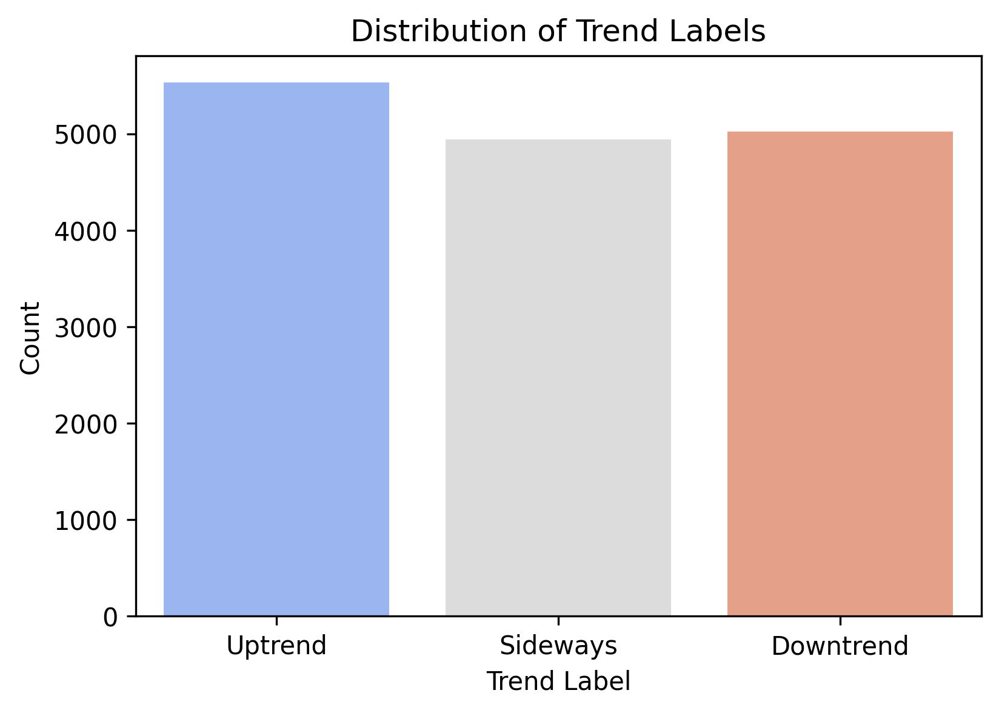

In [1]:
from IPython.display import Image, display

display(Image("../visuals/eda/trend_label_distribution.png"))

The trend labels are relatively well balanced across the three classes, with Uptrend having a slightly higher frequency than Downtrend and Sideways. This balanced distribution is important for classification, as it reduces the risk of the model becoming biased toward a single dominant class and supports more stable training.

### 2.2 Price Trend & Volume Overview

##### Market Trend Overview

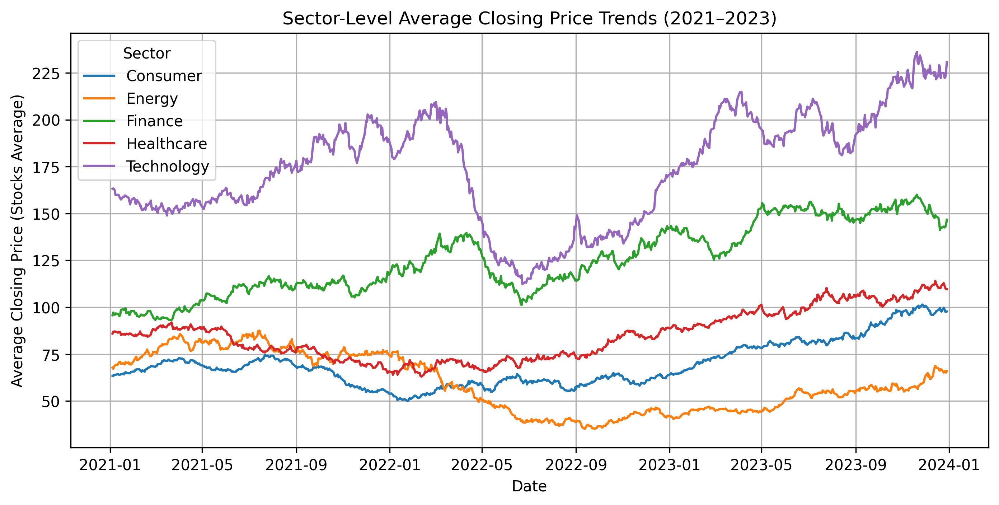

In [2]:
display(Image("../visuals/eda/price_volume_overview.png"))

Sector performance from 2021–2023 shows a broad upward recovery across the market. Technology leads with the strongest appreciation and highest volatility, driven by innovation cycles. Finance demonstrates steady growth with moderate fluctuations, reflecting interest-rate and macroeconomic sentiment. Healthcare and Consumer sectors remain the most stable, showing defensive behavior with smoother price paths. Energy displays the most pronounced cyclical swings, mirroring global commodity and inflation impacts.

##### Trend Classification Behavior

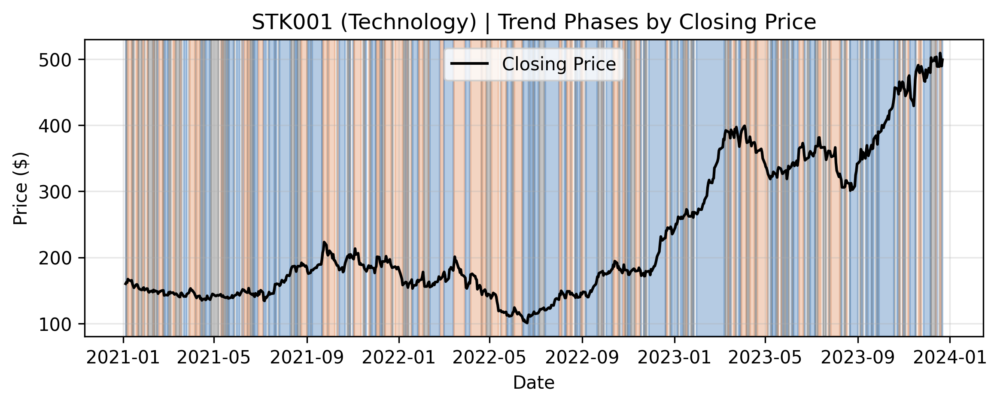

In [3]:
display(Image("../visuals/eda/tech_trend_phases.png"))

Technology Sector (STK001) — Key Trend Insights

- Strong Long-Term Growth:
STK001 shows the most pronounced upward movement among all sectors, especially from late-2022 into 2023, reflecting broad tech-market recovery and renewed investor confidence.

- Frequent Short-Term Trend Shifts:
The alternating trend bands reveal rapid switches between minor uptrends and downtrends, consistent with high-beta technology stocks that react strongly to earnings, macro news, and innovation cycles.

- High Volatility, High Reward:
Although short-term fluctuations are more intense than in Consumer or Healthcare sectors, the dominant long-term pattern remains upward, indicating volatility paired with strong positive momentum.

- Clear Trend Cycles:
Sustained blue (uptrend) phases align with macro tech rallies, while the orange (downtrend) phases correspond to correction periods such as mid-2022.

Overall:
Technology exhibits the steepest growth trajectory and the highest trend sensitivity, making it both a major driver of market performance and the sector with the most dynamic short-term behaviour. This volatility is important for modeling because it creates more pronounced trend transitions, which strengthen the predictive signal for trend classification.

##### Sectoral Volume Pattern

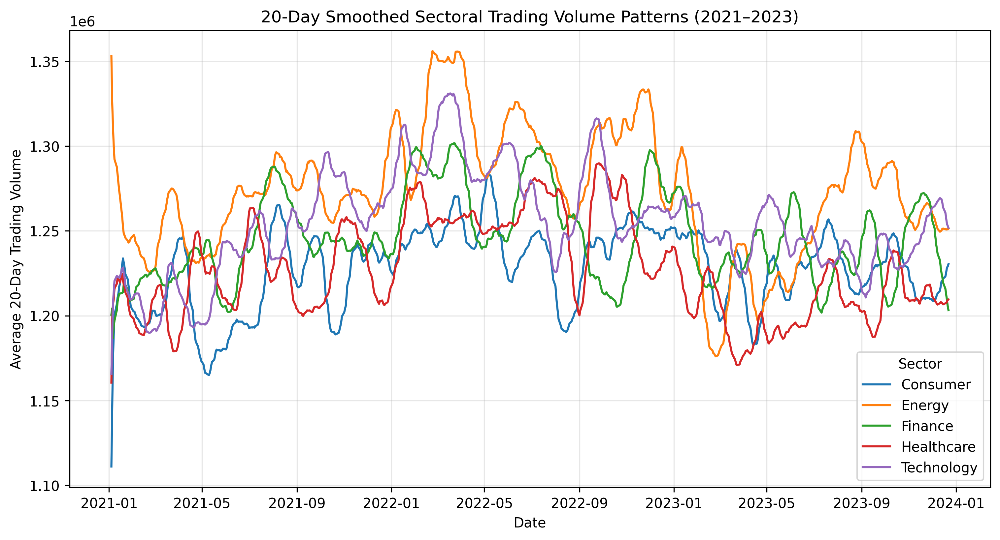

In [4]:
display(Image("../visuals/eda/sectoral_volume_patterns.png"))

The 20-day smoothed sector-level volume trends reveal meaningful differences in market participation across industries:

- Energy consistently records the highest trading volumes, reflecting strong sensitivity to macro events such as oil price shocks, supply-chain disruptions, and geopolitical risks.

- Technology and Finance show moderate but sustained volume activity, consistent with high institutional participation and frequent reactions to earnings cycles and interest-rate policy.

- Healthcare and Consumer sectors exhibit comparatively stable, lower-amplitude volume patterns, indicating steadier investor behavior and fewer speculative surges.

Across 2021–2023, sectoral volumes follow cyclical waves but maintain relative separation, suggesting distinct investor attention cycles. Energy shows the largest volatility in volume, while Healthcare and Consumer remain the most stable.

##### Volume - Price Interaction

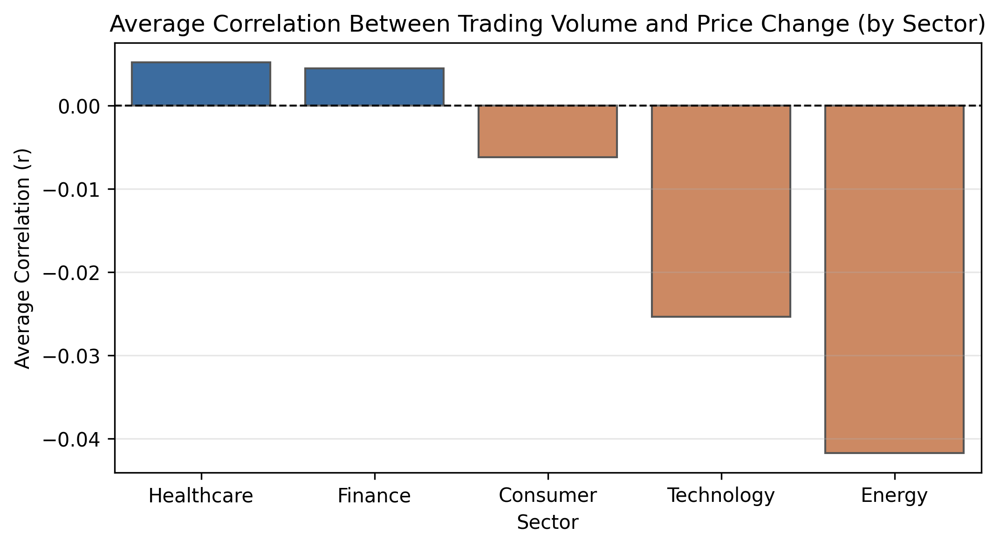

In [5]:
display(Image("../visuals/eda/volume_price_correlation.png"))

The chart shows how strongly trading volume relates to price movement across sectors. Overall, the relationship is weak, indicating that volume alone is not a strong driver of day-to-day price changes in this dataset.

- Healthcare & Finance show slightly positive correlations - small increases in volume tend to accompany mild price gains, reflecting stable information flow and steady investor sentiment.

- Consumer shows a near-zero relationship, meaning volume changes provide almost no directional signal.

- Technology & Energy display negative correlations, suggesting higher trading activity often coincides with price pullbacks — typical in high-volatility sectors where volume spikes occur during corrections or news-driven selloffs.

Conclusively, volume movements behave differently across sectors, but overall are not strong predictors of price direction. 

### 2.3. Technical Indicator Pattern

##### RSI Trend Patterns (20-Day Smoothed)

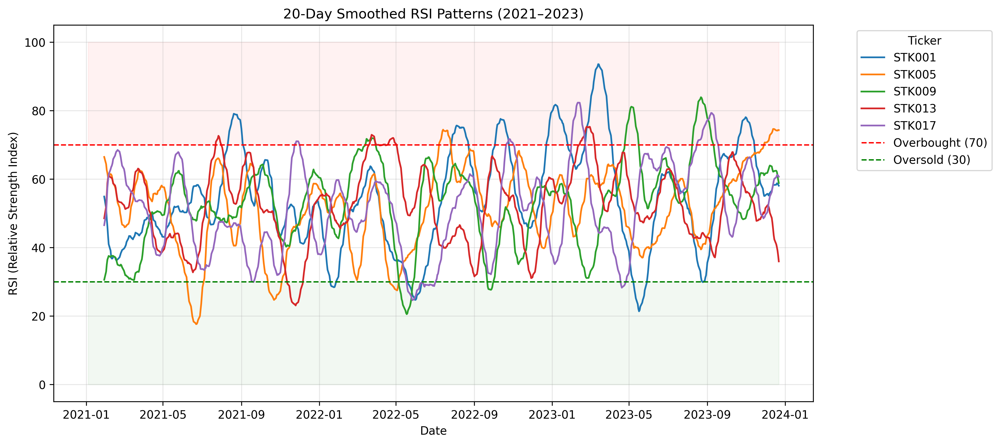

In [6]:
display(Image('../visuals/eda/rsi_trend_patterns.png'))

The 20-day smoothed RSI reveals clearer momentum patterns across all sectors by filtering out short-term noise:

- Most RSI values hover between 35–70, indicating predominantly neutral momentum.

- Occasional RSI spikes above 70 correspond to sector-level rallies, especially in Technology and Finance.

- Dips below 30 are infrequent but align with broad correction periods (e.g., mid-2022).

- Technology and Energy show the widest RSI swings, reflecting higher volatility and momentum sensitivity.

- Consumer and Healthcare remain the most stable, rarely breaching overbought/oversold thresholds.

Overall:
The smoothed RSI emphasizes sector momentum cycles without noise, confirming that most movements are range-bound, with only periodic momentum surges driving strong trend phases.

##### MACD Crossover and Price Trends

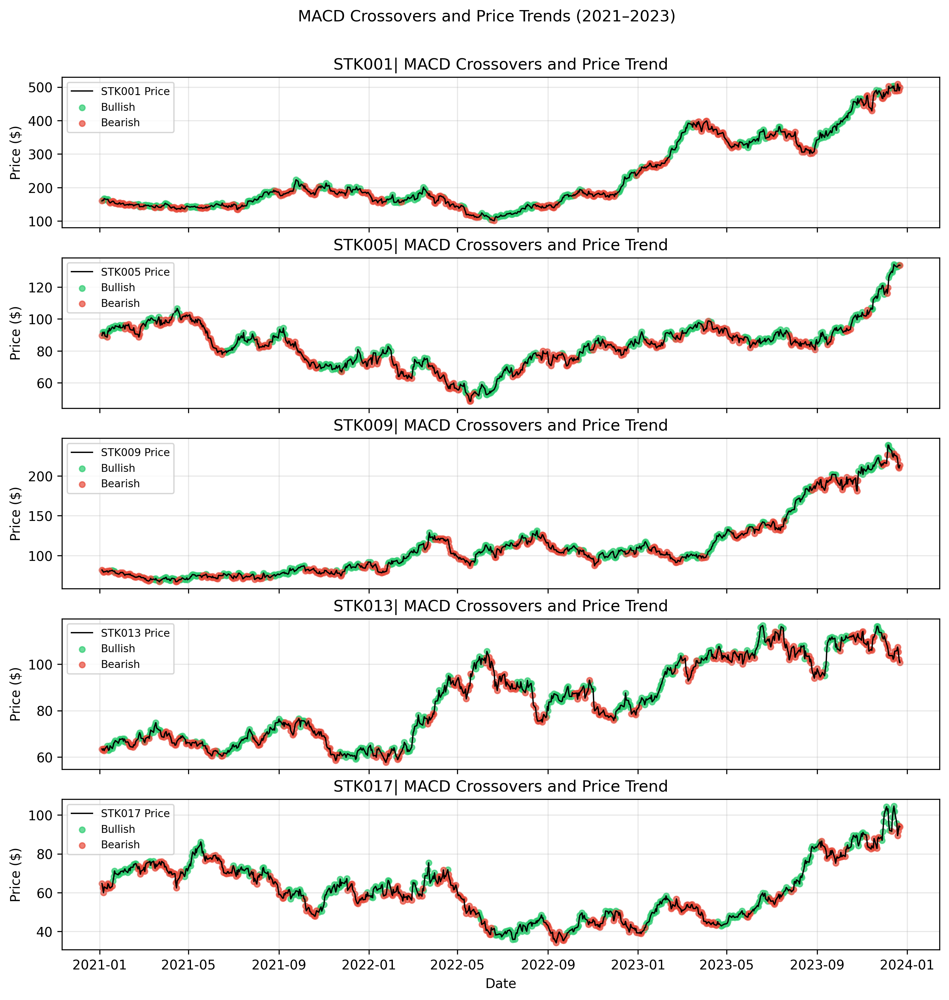

In [7]:
display(Image('../visuals/eda/macd_crossovers_price_trend.png'))

MACD crossovers effectively captured short-term momentum shifts across sectors. While the frequency and intensity varied by stock, the overarching patterns were clear:

- Bullish crossovers frequently precede sustained rally segments, especially in Technology and Finance.

- Bearish crossovers signaled cooling momentum or impending pullbacks and aligns well with short-term corrections.

- Technology and Finance benefited most from MACD as a trend indicator.

- Energy shows the most irregular crossover timing, reflecting sector cyclicality.

- Sector-specific volatility influenced the strength and reliability of signals.

In summary, MACD provided strong confirmation for trend direction,

##### Bollinger Band & Volatility

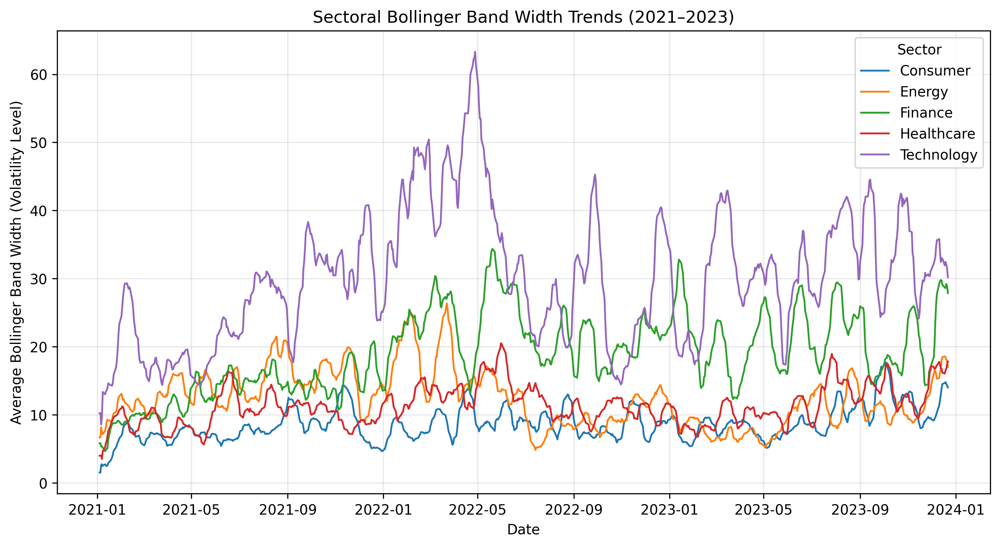

In [8]:
display(Image('../visuals/eda/bollinger_bandwidth_trend.png'))

Sector-level Bollinger Band widths show:

- Technology consistently exhibits the widest bands → highest volatility.

- Finance follows, driven by rate-sensitive fluctuations.

- Consumer & Healthcare show tight, stable bands.

- Energy spikes during commodity-driven events.

**Volatility implication:**
Bollinger width validates volatility features like volatility_20 and true_range.

## 3. Model Evaluation and Final reporting

### 3.1 Baseline Model Performance

The purpose of the baseline model is to establish a simple benchmark before introducing feature engineering, feature selection, or advanced algorithms. Logistic Regression was selected as the baseline because:

- It is interpretable and fast,

- It provides a meaningful benchmark for multi-class classification,

- It allows us to assess whether more complex models (like Random Forest) provide tangible improvements.

In [12]:
import joblib

lr = joblib.load("../models/baseline_logreg_model.pkl")

print (lr)

LogisticRegression(max_iter=1000)


The model tends to over-predict Downtrend, resulting in high recall but low precision.

Uptrend detection is very weak (recall only 0.11), indicating that linear relationships alone do not adequately capture market up-moves.

Overall performance stabilizes around 34% accuracy, close to random guessing for 3 classes (33%), meaning the model fails to capture nonlinear or temporal patterns in price behavior.

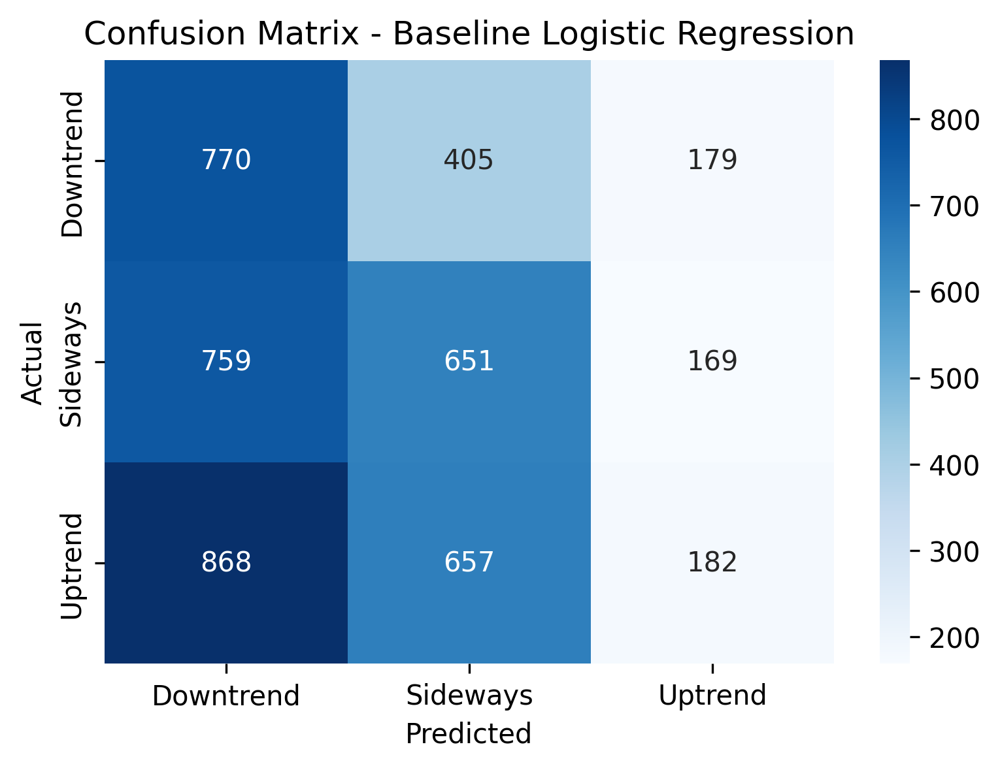

In [14]:
display(Image('../visuals/model_performance/baseline_logreg_confusion_matrix.png'))

- Most actual Uptrend and Sideways samples were misclassified as Downtrend.

- This confirms that Logistic Regression struggles to separate pattern boundaries in a noisy, nonlinear financial dataset.

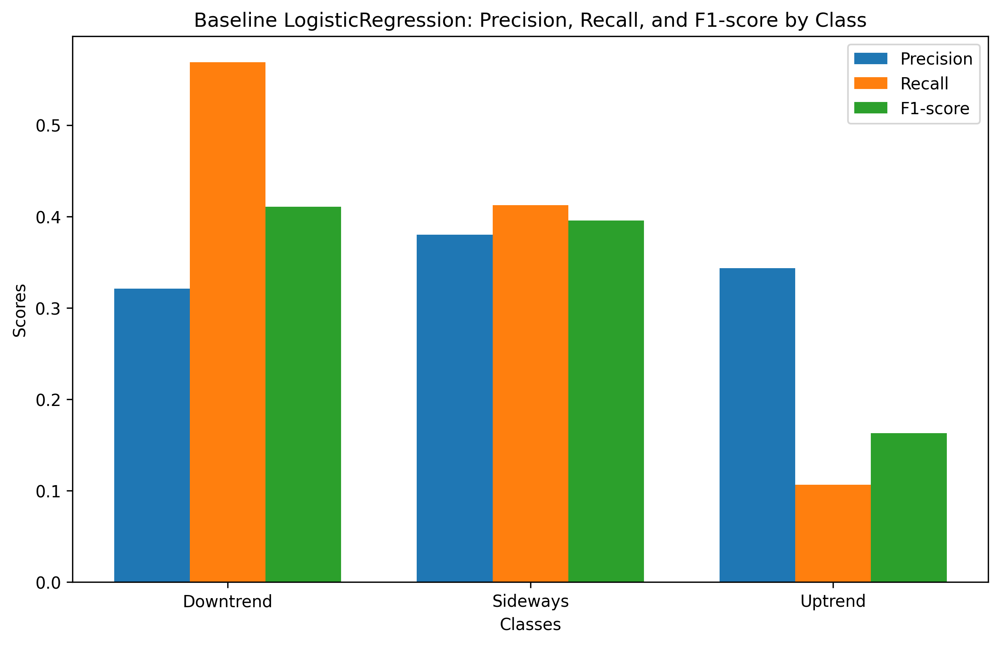

In [15]:
display(Image('../visuals/model_performance/log_reg_prf1_class.png'))

The baseline Logistic Regression model demonstrates uneven performance across trend classes, highlighting the challenge of predicting multi-class market movements:

- Downtrend shows the strongest recall (~0.57) and overall F1 (~0.41), meaning the model is best at identifying falling markets.

- Sideways trends achieve moderate precision and recall, with an F1 of ~0.39, reflecting difficulty in distinguishing consolidation periods from other patterns.

- Uptrend is the weakest class, with very low recall (~0.11), indicating the model struggles significantly to detect upward movement.

Overall, the baseline model is biased toward detecting Downtrends while frequently misclassifying Uptrends, which aligns with the class imbalance and overlapping feature patterns in market data. This establishes a meaningful baseline for evaluating improvements after feature engineering and model tuning.

### 3.2. Improved Model Pipeline

This section describes the step-by-step process used to transform the baseline model into an improved and optimized forecasting system. The goal is to enhance predictive power, reduce redundancy, and build a more stable and interpretable machine-learning pipeline.

**Step 1 - Feature Engineering**

Created additional predictive signals:

- price-based returns (1d, 2d, 7d) and other lagged variables to capture short-term momentum and autocorrelation effects

Goal: enrich the feature space with signals that capture market momentum, trend direction, and volatility structure. These additions allowed the model to learn richer temporal and structural market behaviors that are not visible in the raw data alone.

**Step 2 - Multicollinearity Reduction (Correlation + VIF)**

- Computed a full correlation matrix to detect highly correlated features.

- Applied VIF to quantify redundancy.

- Removed duplicated information (e.g., similar moving-average signals, correlated lag features).

Outcome: Reduced the feature set to a stable, non-redundant subset that prevents model overfitting and improves interpretability.

**Step 3 - Feature Selection Using FI & SHAP**

- Random Forest Feature Importance ranked features by predictive contribution.

- SHAP explained directionality and impact of each feature across the three trend classes.

Outcome: Confirmed that volatility_20, sma_20, market-index returns, and MACD-related metrics were genuinely useful and should be retained.

**Step 4 - Train the Improved Model**

- Retrained the model using the cleaned & optimized feature set.

- Applied SMOTE to correct class imbalance.

**Step 5 - Hyperparameter Tuning**

RandomSearchCV was applied with best estimator as: max_depth=40, max_features='log2', min_samples_split=5, min_samples_leaf=1, n_estimators=200 and random_state=42

**Step 6 - Evaluate the Tuned Model**

- Evaluated accuracy, precision, recall, and F1-score per class.

- Generated confusion matrix to visually inspect prediction distribution.

Result:
The tuned model showed small but consistent improvements in recall and F1 on the “Uptrend” and “Sideways” classes, indicating better sensitivity after feature engineering and tuning.

### 3.3 Feature Correlation (Post Feature Engineering) 

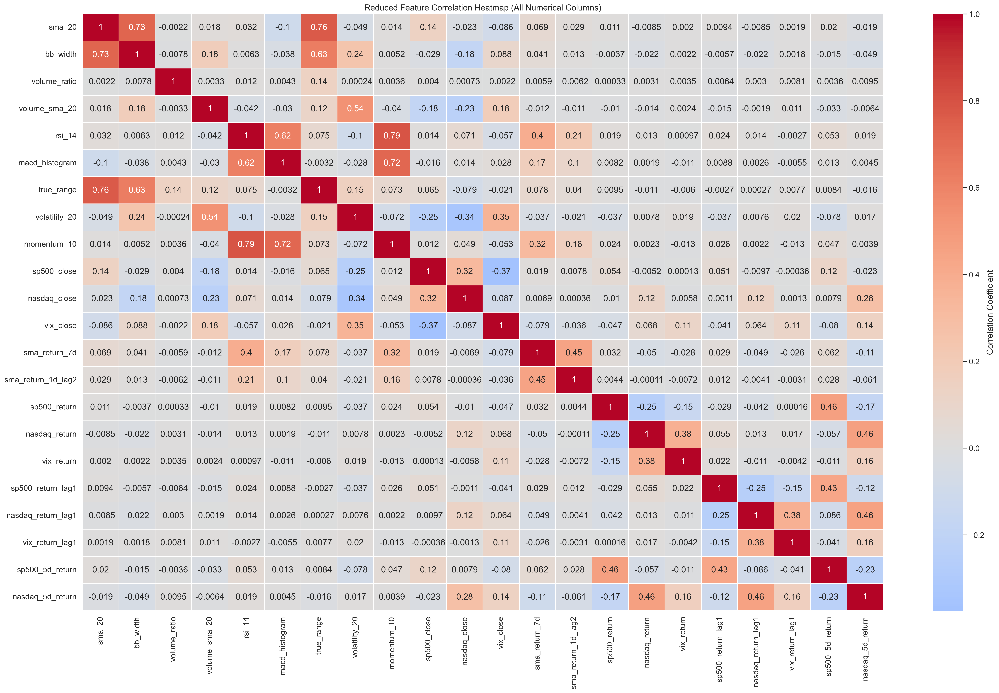

In [16]:
display(Image('../visuals/model_performance/reduced_correlation_heatmap.png'))

The reduced correlation heatmap shows no severe pairwise correlations among the selected features. While some indicators exhibit moderate relationships (expected in technical analysis), multicollinearity was quantitatively assessed using Variance Inflation Factor (VIF), with all features recording VIF values below 5. This confirms that the final feature set is stable, non-redundant, and suitable for downstream modeling and interpretation.

### 3.4. Feature Selection

##### 3.4.1. Feature Importance

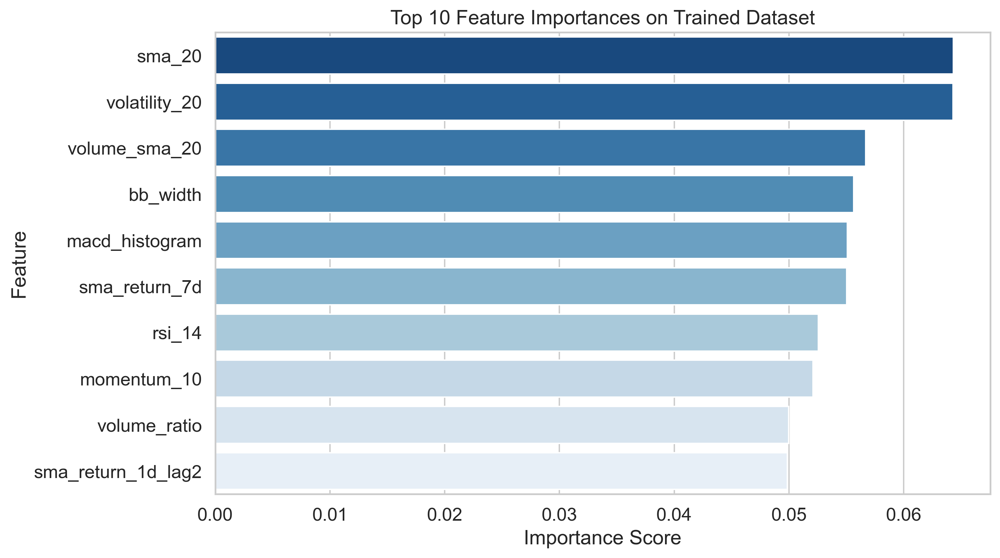

In [19]:
display(Image('../visuals/model_performance/top10_feature_importance.png'))

After addressing multicollinearity through correlation analysis and VIF filtering, the refined feature set was used to retrain both Logistic Regression and Random Forest models. Feature importance was then extracted only from the Random Forest, as it naturally captures non-linear relationships and interaction effects.

Using the SMOTE-resampled training dataset, Random Forest feature importances revealed that the model primarily relies on:

- Trend and smoothing indicators: sma_20, sma_return_7d

- Volatility measures: volatility_20, bb_width

- Momentum indicators: macd_histogram, rsi_14, momentum_10

- Volume dynamics: volume_sma_20, volume_ratio

- Short-term price memory: sma_return_1d_lag2

The dominance of moving averages, volatility, and momentum-based features indicates that the model learns market regime behavior rather than raw price levels. Importantly, this aligns with prior correlation and VIF analysis, confirming that retained features are both informative and non-redundant.

This feature importance ranking guided the subsequent SHAP analysis, which was used to validate feature contributions across classes and finalize the model for tuning.

##### 3.4.2. SHAP Analysis

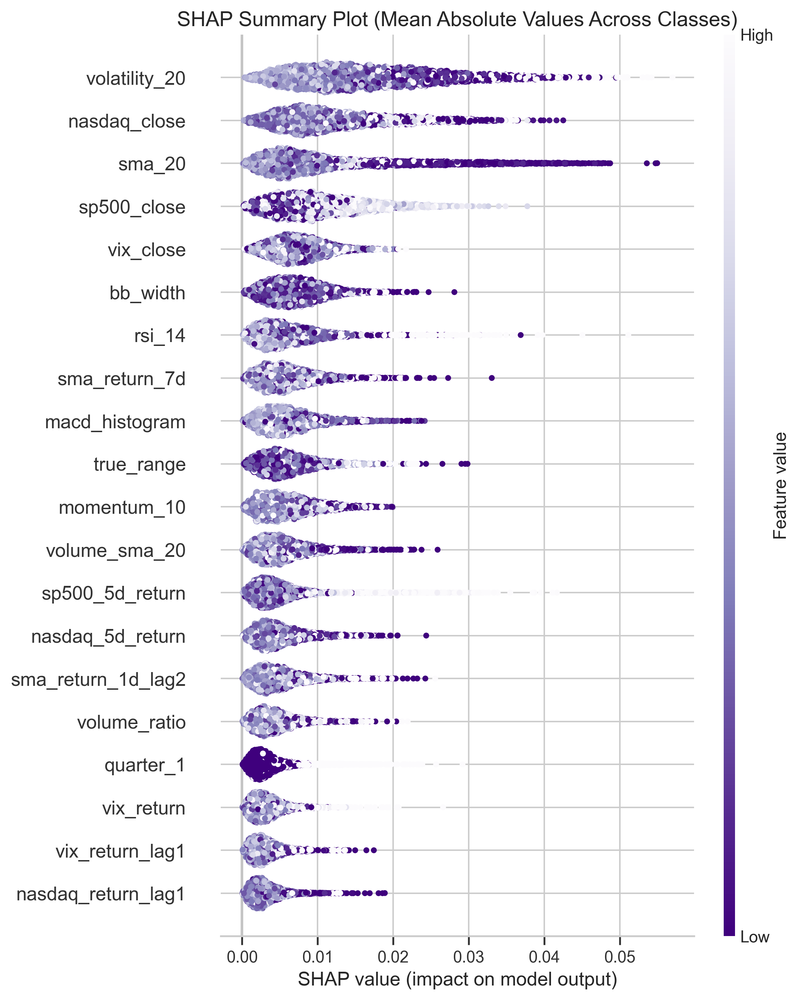

In [20]:
display(Image('../visuals/model_performance/shap_summary.png'))

After training the Random Forest model on the SMOTE-resampled dataset, SHAP (SHapley Additive exPlanations) was applied to gain deeper insight into feature contributions across all classes (Uptrend, Sideways, Downtrend). Key SHAP insights include:

- Volatility and trend-based indicators (volatility_20, sma_20, bb_width, true_range) consistently showed the strongest influence on model predictions.

- Market index levels (nasdaq_close, sp500_close, vix_close) contributed meaningfully, reflecting broader market regime effects.

- Momentum and oscillator features (macd_histogram, rsi_14, sma_return_7d) provided complementary signals rather than redundant information.

- Lagged and longer-horizon returns (sp500_5d_return, nasdaq_5d_return, sma_return_1d_lag2) had moderate but stable contributions.

- Calendar features and weaker lag variables showed minimal impact and were excluded.

Based on SHAP impact magnitude and stability across classes, the following features were retained for retraining and hyperparameter tuning:  volatility_20, sma_20, nasdaq_close, sp500_close, bb_width, sma_return_7d, vix_close, macd_histogram, rsi_14, true_range, volume_sma_20, sp500_5d_return, sma_return_1d_lag2, nasdaq_5d_return.

These features balance trend strength, volatility, momentum, volume dynamics, and market-wide signals, forming a robust input set for the final tuned model.


### 3.5 Improved Model

##### 3.5.1 RandomForest HyperParameter Tuned Model & Confusion Matrix

In [21]:
tuned_model = joblib.load("../models/tuned_improved_rf_fi_model.pkl")

print(tuned_model)

RandomForestClassifier(max_depth=40, max_features='log2', min_samples_split=5,
                       n_estimators=200, random_state=42)


Tuned Random Forest (FI) Classification Report (Improved):

              precision    recall  f1-score   support

           0       0.29      0.28      0.28      1354
           1       0.37      0.32      0.35      1579
           2       0.37      0.42      0.39      1707

    accuracy                           0.35      4640
   macro avg       0.34      0.34      0.34      4640
weighted avg       0.35      0.35      0.34      4640




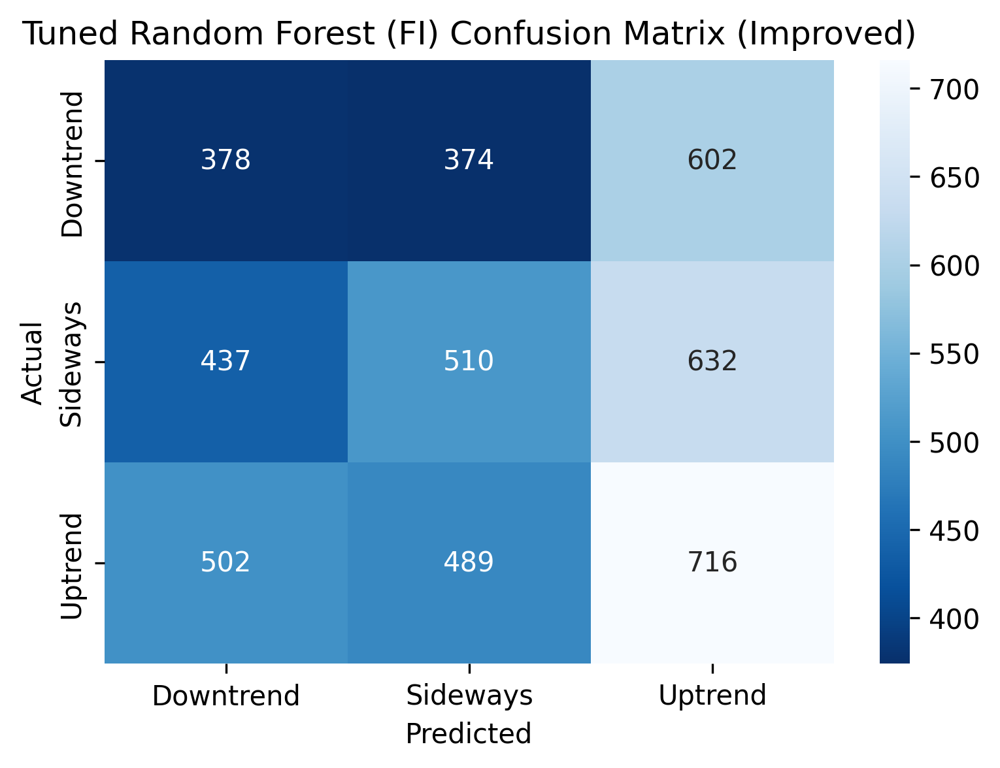

In [25]:
display(Image('../visuals/model_performance/tuned_rf_fi_confusion_matrix.png'))

##### 3.5.2 Performance Analysis

The tuned Random Forest achieves an overall accuracy of 35% with a macro F1-score of 0.34, indicating modest predictive performance across the three market regimes. While hyperparameter tuning improved class balance handling, the task remains challenging due to overlapping market dynamics and noisy financial signals.

**Class-wise Behavior (Supported by Confusion Matrix)**

1. Uptrend (Class 2) – Best Learned

- Highest recall (0.42) and F1-score (0.39)

- The model correctly identifies 716 uptrend cases

- However, many sideways and downtrend instances are misclassified as uptrend 

This suggests the model is biased toward predicting Uptrend, likely driven by strong momentum and volatility features.

2. Sideways (Class 1) – Moderate Performance

- Balanced but weaker recall (0.32) and F1-score (0.35)

- Significant confusion with Uptrend (632 cases)

This highlights the difficulty in separating consolidation phases from emerging trends.

3. Downtrend (Class 0) – Weakest Performance

- Lowest recall (0.28) and F1-score (0.28)

- Majority of downtrends are misclassified as Sideways or Uptrend

This reflects asymmetric market behavior where declines are less structurally distinct than rallies.

Overall, the model captures directional momentum better than regime transitions, performing best during sustained upward movements but struggling to distinguish Downtrend and Sideways states.

##### 3.5.3. Feature Importance on Test Data (Post-Tuned)

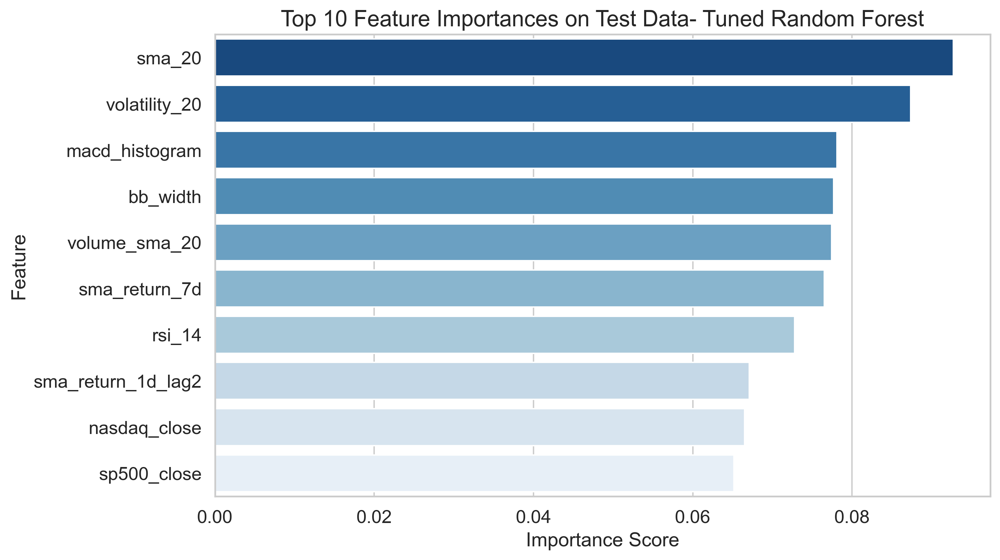

In [26]:
display(Image('../visuals/model_performance/top10_tuned_rf_feature_importance.png'))

- The dominance of sma_20 and volatility_20 on test data confirms that the model generalizes its reliance on trend strength and market uncertainty.

- Consistent mid-ranking of bb_width, macd_histogram, rsi_14, and volume_sma_20 shows technical indicators jointly contribute rather than a single feature overfitting.

- Alignment with training-set importance suggests stable learning, not noise memorization.

##### 3.5.4 SHAP Analysis

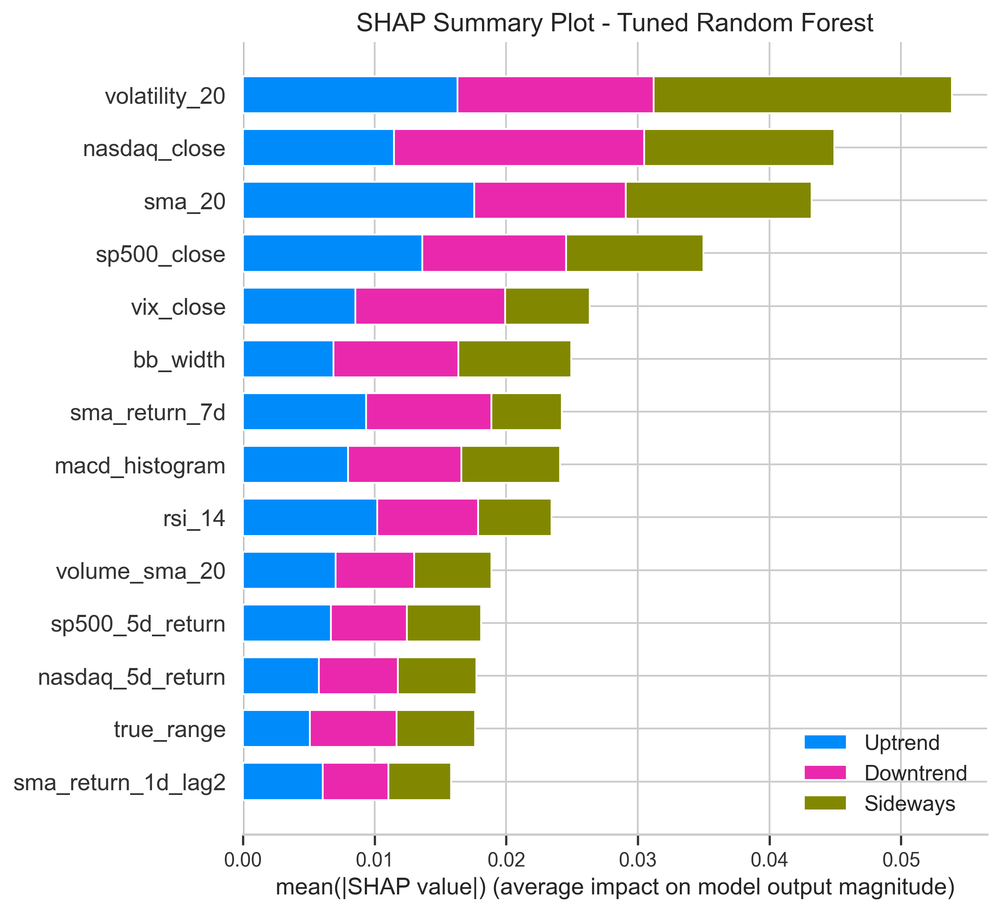

In [28]:
display(Image('../visuals/model_performance/tuned_shap_summary_plot.png'))

**Why SHAP**

While Random Forest feature importance reflects how often features are used for splits, it does not capture direction, interaction effects, or class-specific influence.
SHAP was therefore used as the primary interpretability tool because it provides consistent, local-to-global explanations and reveals how features push predictions toward Uptrend, Downtrend, or Sideways states

**What it reveals**

The SHAP summary plot shows that volatility_20, sma_20, and nasdaq_close are the most influential drivers of model predictions across all classes.

- Volatility_20 contributes strongly to all three regimes, particularly Sideways markets, indicating sensitivity to market uncertainty.

- Trend and price-level features (sma_20, nasdaq_close, sp500_close) play a dominant role in distinguishing Uptrend versus Downtrend.

- Momentum and range-based indicators (macd_histogram, rsi_14, bb_width, true_range) provide secondary but consistent contributions, refining regime classification rather than dominating it.

### 4. Overall Business Insights & Key Takeaways

This notebook evaluated both a baseline and an improved machine learning pipeline to predict short-term market regimes (Downtrend, Sideways, Uptrend), with emphasis on model reliability, interpretability, and real-world usability.

##### 1. Baseline vs Improved Model

- he baseline Logistic Regression provided a transparent benchmark but showed limited ability to distinguish market regimes, especially Uptrend.

- The improved Random Forest, enhanced through feature engineering, multicollinearity control, SHAP-guided feature selection, and hyperparameter tuning, delivered more balanced class performance, particularly improving Uptrend recall.

**Insight:** Non-linear models better capture market dynamics than linear baselines.

##### 2. Feature Engineering & Stability

- Correlation analysis and VIF confirmed that the final feature set had acceptable multicollinearity (VIF < 5 across features).

- This ensured model stability and reduced the risk of redundant signals dominating predictions.

**Insight:** Feature pruning improved robustness without sacrificing information content.

##### 3. What Drives Market Regime Predictions

Across Feature Importance and SHAP analyses, the model consistently relied on:

- Volatility & trend indicators (volatility_20, sma_20, bb_width)

- Market context variables (NASDAQ, S&P 500, VIX)

- Momentum & short-term returns

SHAP was prioritized over traditional feature importance because it:

- Explains both magnitude and direction of impact

- Shows class-specific contributions

- Remains reliable under correlated features

**Insight:** Market regime classification is primarily volatility and trend-driven, not price-level driven alone.

##### 4. Model Behavior by Market Regime

- Uptrend predictions were driven by rising volatility and trend confirmation.

- Sideways regimes were influenced by mixed signals across volatility and momentum.

- Downtrend predictions reflected broader market stress signals (VIX, index returns).

**Insight:** The model distinguishes regimes based on market structure, not noise.

##### 5. Business & Practical Implications

- The tuned model is best suited as a decision-support tool, not a standalone trading signal.

- Stronger performance in Uptrend detection makes it valuable for:

  - Timing risk-on strategies

  - Supporting portfolio allocation decisions

- Misclassification between Sideways and Downtrend highlights the inherent uncertainty of transitional market phases.

**Final Takeaway:**
The improved Random Forest model provides interpretable, volatility-aware regime classification that aligns with real market behavior and offers practical value for strategy support and risk management.